In [23]:
import numpy as np
import cv2

In [24]:
base_data_folder = 'data/'

In [48]:
def show_image(img, title=""):
    plt.figure(figsize=(15,15))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    if title:
        plt.title(title)
    plt.show()
    
def read_img(filename):
    return cv2.imread(base_data_folder + filename)

In [41]:
# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

########################################Blob Detector##############################################

# Setup SimpleBlobDetector parameters.
blobParams = cv2.SimpleBlobDetector_Params()

# Change thresholds
blobParams.minThreshold = 30
blobParams.maxThreshold = 255

# Filter by Area.
blobParams.filterByArea = True
# blobParams.minArea = 1364   # minArea may be adjusted to suit for your experiment
# blobParams.maxArea = 6000   # maxArea may be adjusted to suit for your experiment
blobParams.minArea = 100   # minArea may be adjusted to suit for your experiment
blobParams.maxArea = 1000000   # maxArea may be adjusted to suit for your experiment

# Filter by Circularity
blobParams.filterByCircularity = True
blobParams.minCircularity = 0.4

# Filter by Convexity
blobParams.filterByConvexity = True
blobParams.minConvexity = 0.87

# Filter by Inertia
blobParams.filterByInertia = True
blobParams.minInertiaRatio = 0.01

# Create a detector with the parameters
blobDetector = cv2.SimpleBlobDetector_create(blobParams)

In [42]:
objp = np.zeros((44, 3), np.float32)
for x in range(0, 11):
    for y in range(0, 4):
        objp[4*x+y] = (x*36, y*72 + (x%2)*36, 0)


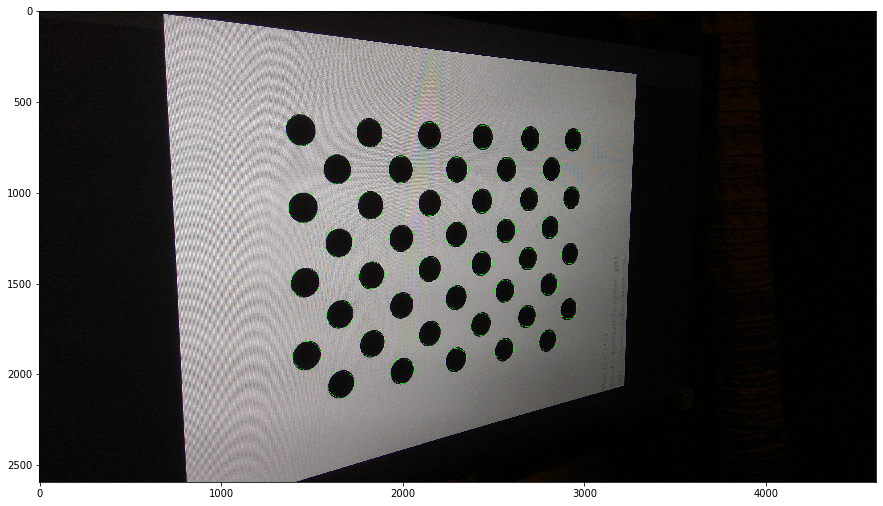

44


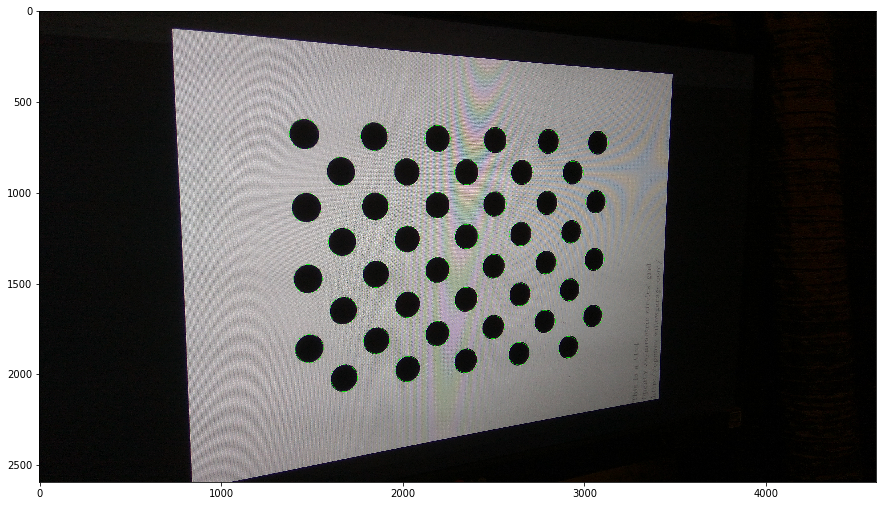

44


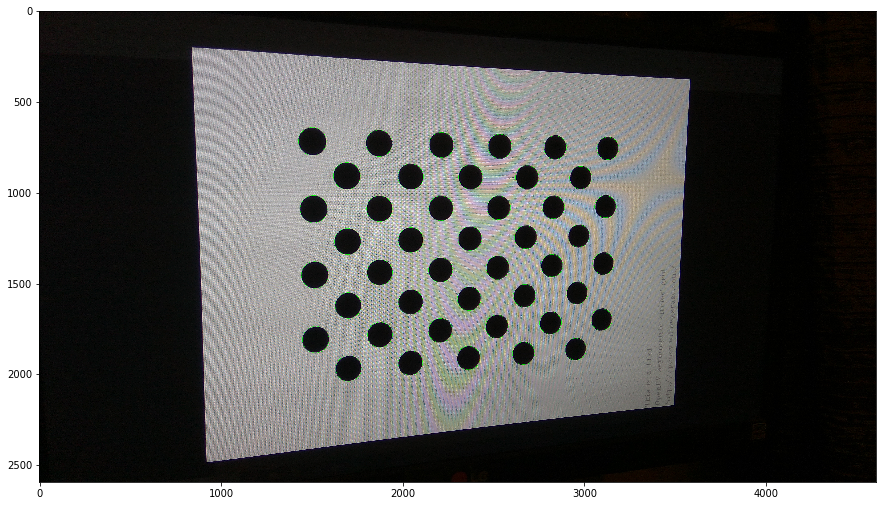

44


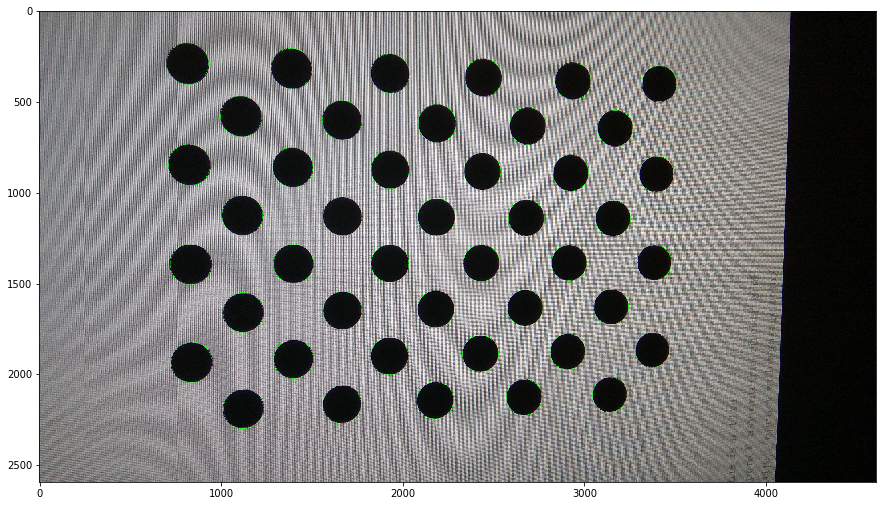

44


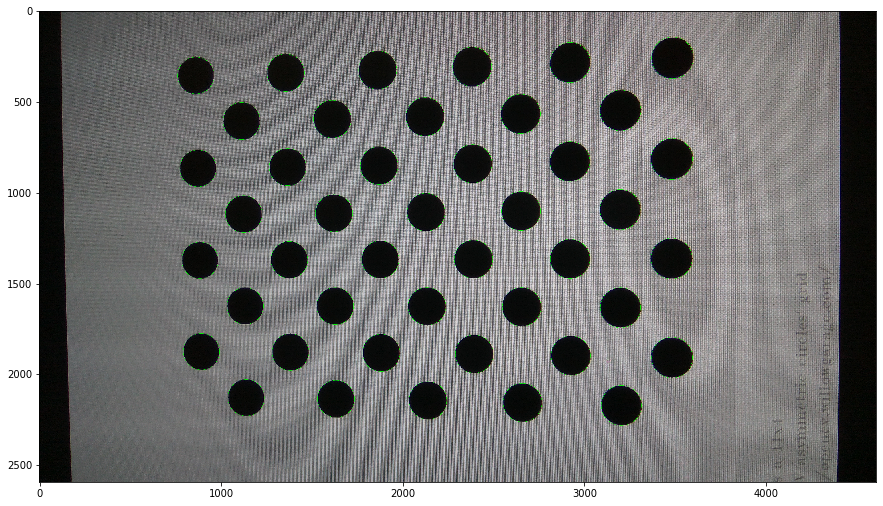

44


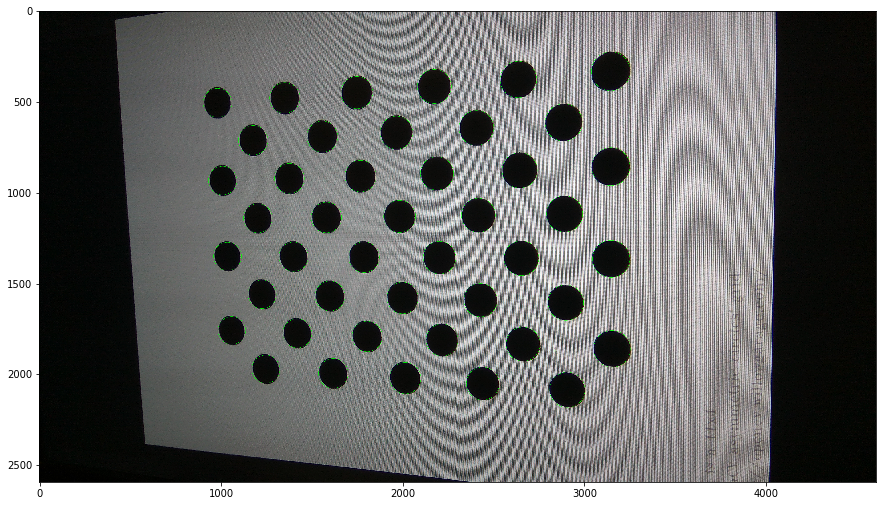

44


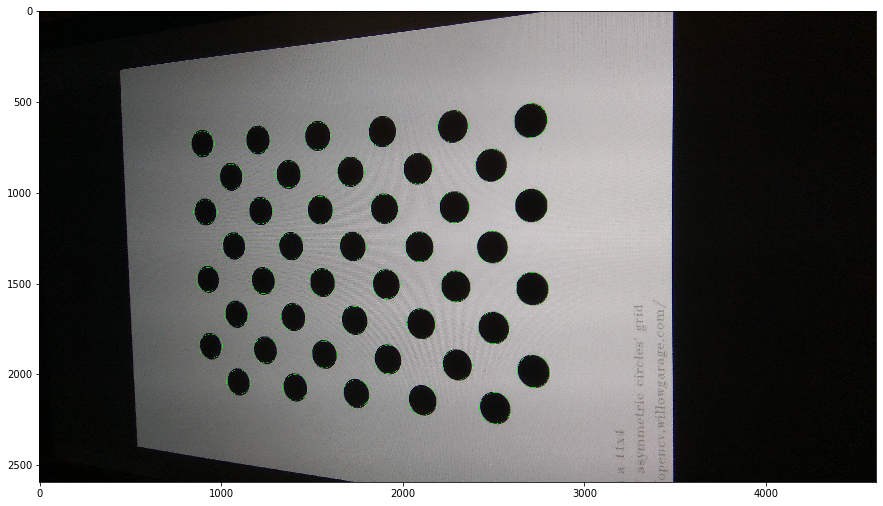

44


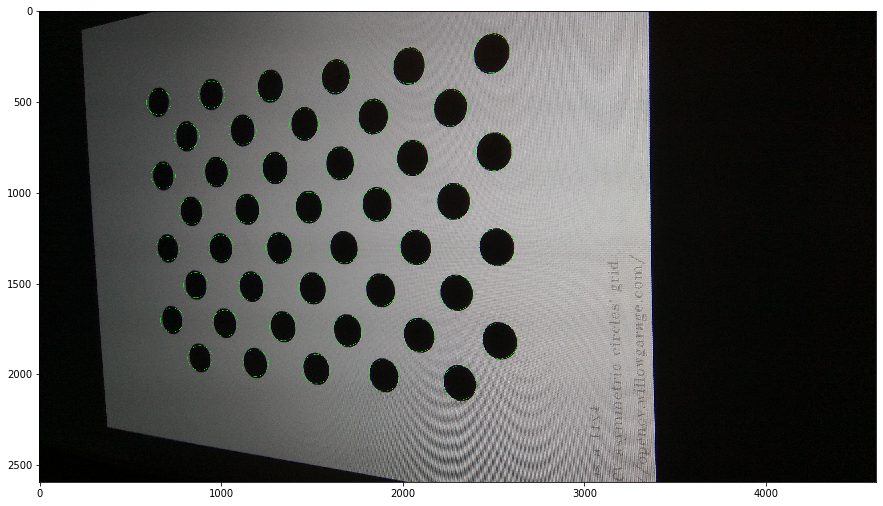

44


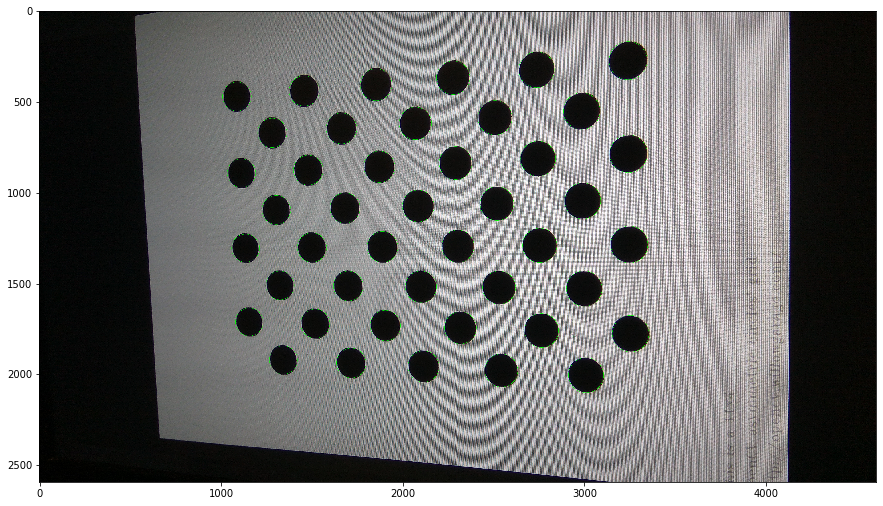

44
(9, 44, 3)
(9, 44, 1, 2)
(9, 44, 2)
[[3.65936675e+03 0.00000000e+00 2.30520403e+03]
 [0.00000000e+00 3.65618005e+03 1.32124515e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
[[ 9.77834499e-02  8.04644970e-03  3.68253422e-04  1.26819792e-03
  -5.50626267e-01]]


In [49]:
objpoints = None # 3d point in real world space
imgpoints = None # 2d points in image plane.
for f in range(1,10):
    img = read_img("img-%02d.jpg" % f)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    keypoints = blobDetector.detect(gray)
    im_with_keypoints = cv2.drawKeypoints(img, keypoints, np.array([]), (0,255,0), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    ret, corners = cv2.findCirclesGrid(
        gray, (4,11), flags = cv2.CALIB_CB_ASYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING,
        blobDetector = blobDetector
    )   # Find the circle grid
    show_image(im_with_keypoints)
    print(len(keypoints))
    if corners is not None and ret:
        objpoints = np.array([objp]) if objpoints is None else np.append(objpoints, [objp], axis = 0)
        imgpoints = np.array([corners]) if imgpoints is None else np.append(imgpoints, [corners], axis = 0)
    else:
        print("Skip img-%02d.jpg" % f)


print(objpoints.shape)
print(imgpoints.shape)
(i1, i2, i3, i4) = imgpoints.shape;
imgpoints = imgpoints.reshape([i1, i2, i4])
print(imgpoints.shape)
  
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

print(mtx)
print(dist)



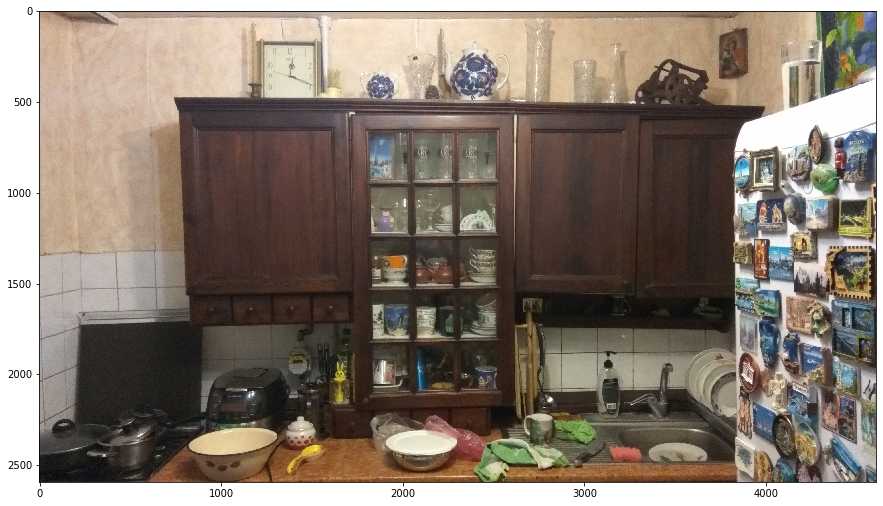

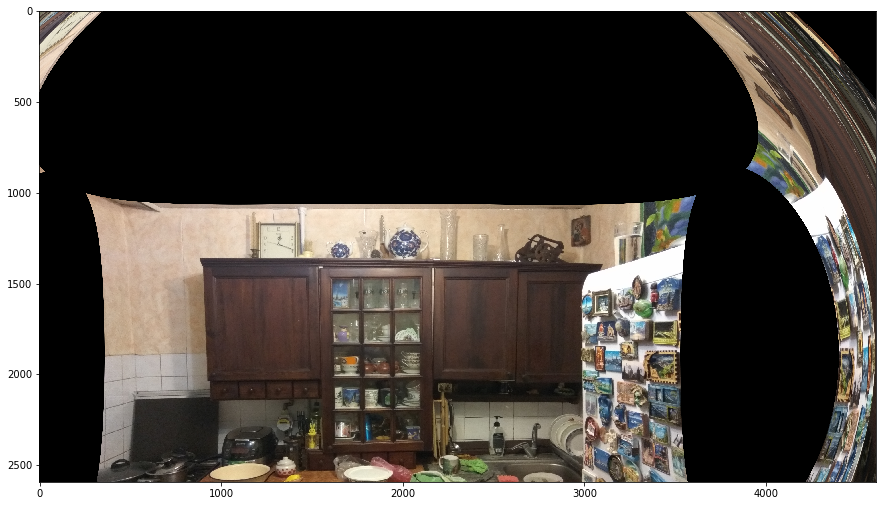

In [50]:
#dist = np.array([0,0,0,0,0])
test = read_img("img-test.jpg")

show_image(test)

(w,h) = test.shape[:2]
newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))
dst = cv2.undistort(test, mtx, dist, None, newcameramtx)
#mapx,mapy = cv2.initUndistortRectifyMap(mtx,dist,None,newcameramtx,(w,h),5)
#dst = cv2.remap(img,mapx,mapy,cv2.INTER_LINEAR)

# crop the image
#x,y,w,h = roi
#dst = dst[y:y+h, x:x+w]
#dst = cv2.resize(dst, (0,0), fx=0.25, fy=0.25) 
show_image(dst)